<a href="https://colab.research.google.com/github/Hrishita-Dalal/CPML24_Projects_and_Labs/blob/main/Hierarchical%20Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lab by Ganesh Chandan

kanakala.ganesh@research.iiit.ac.in

# Hierarchical Clustering

KMeans is an iterative process. It will keep on running until the centroids of newly formed clusters do not change or the maximum number of iterations are reached.

But there are certain challenges with K-means. It always tries to make clusters of the same size. Also, we have to decide the number of clusters at the beginning of the algorithm. Ideally, we would not know how many clusters should we have, in the beginning of the algorithm and hence it a challenge with K-means.

This is a gap hierarchical clustering bridges with aplomb. It takes away the problem of having to pre-define the number of clusters. Sounds like a dream! So, let’s see what hierarchical clustering is and how it improves on K-means.

## What is Hierarchical Clustering?

Let’s say we have the below points and we want to cluster them into groups:

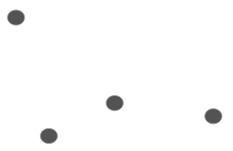

We can assign each of these points to a separate cluster:

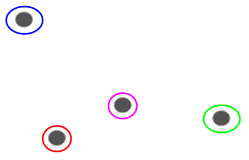

Now, based on the similarity of these clusters, we can combine the most similar clusters together and repeat this process until only a single cluster is left:

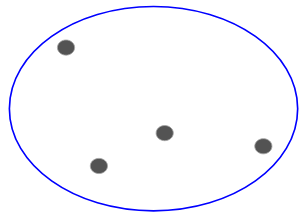

We are essentially building a hierarchy of clusters. That’s why this algorithm is called hierarchical clustering. I will discuss how to decide the number of clusters in a later section. For now, let’s look at the different types of hierarchical clustering.

## Agglomerative Hierarchical Clustering

In this technique, initially each data point is considered as an individual cluster. At each iteration, the similar clusters merge with other clusters until one cluster or K clusters are formed.

The basic algorithm of Agglomerative is straight forward.

    Compute the proximity matrix
    Let each data point be a cluster
    Repeat: Merge the two closest clusters and update the proximity matrix
    Until only a single cluster remains

To understand better let’s see a pictorial representation of the Agglomerative Hierarchical clustering Technique. Lets say we have six data points {A,B,C,D,E,F}.

    Step- 1: In the initial step, we calculate the proximity of individual points and consider all the six data points as individual clusters as shown in the image below.

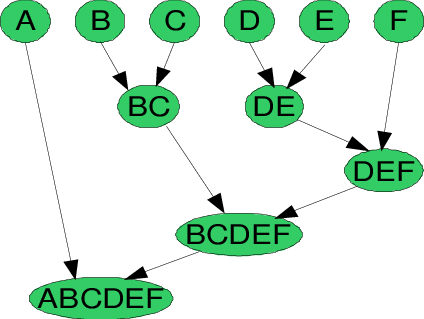

    Step- 2: In step two, similar clusters are merged together and formed as a single cluster. Let’s consider B,C, and D,E are similar clusters that are merged in step two. Now, we’re left with four clusters which are A, BC, DE, F.
    Step- 3: We again calculate the proximity of new clusters and merge the similar clusters to form new clusters A, BC, DEF.
    Step- 4: Calculate the proximity of the new clusters. The clusters DEF and BC are similar and merged together to form a new cluster. We’re now left with two clusters A, BCDEF.
    Step- 5: Finally, all the clusters are merged together and form a single cluster.

Here is what this process in action looks like.

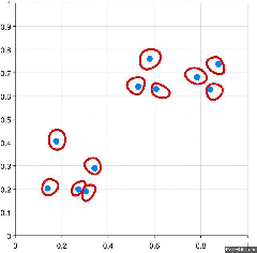

## Dendograms

A Dendrogram is a type of tree diagram showing hierarchical relationships between different sets of data.

As already said a Dendrogram contains the memory of hierarchical clustering algorithm, so just by looking at the Dendrgram you can tell how the cluster is formed.

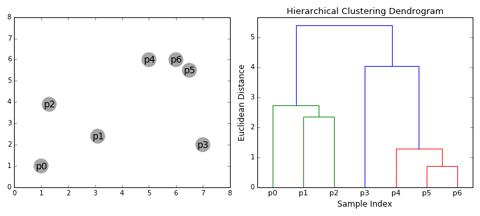



Note:-

    Distance between data points represents dissimilarities.
    Height of the blocks represents the distance between clusters.

So you can observe from the above figure that initially P5 and P6 which are closest to each other by any other point are combined into one cluster followed by P4 getting merged into the same cluster(C2). Then P1and P2 gets combined into one cluster followed by P0 getting merged into the same cluster(C4). Now P3 gets merged in cluster C2 and finally, both clusters get merged into one.

**How do you decide when to stop merging the clusters?**

You cut the dendrogram tree with a horizontal line at a height where the line can traverse the maximum distance up and down without intersecting the merging point.

For example in the below figure L3 can traverse maximum distance up and down without intersecting the merging points. So we draw a horizontal line and the number of verticle lines it intersects is the optimal number of clusters.

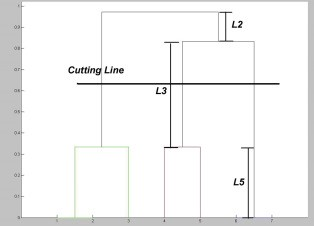

In [1]:
# load necessary files

!curl -L -o 'Mall_Customers.csv' 'https://drive.google.com/uc?export=download&id=1sgy48AZi0It6VBMQXTJbRLjlIg6E7HlY'
!curl -L -o 'Wholesale customers data.csv' 'https://drive.google.com/uc?export=download&id=1Jvqxa_KkjX8nZ5oxXe_6CzQ6aI3vVIZV'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  4286  100  4286    0     0   1534      0  0:00:02  0:00:02 --:--:--  1861
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 15021  100 15021    0     0   6572      0  0:00:02  0:00:02 --:--:-- 16309


### Agglomerative Clustering on Mall Visitors Database

In [2]:
# importing neccessary libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.cluster.hierarchy as sch

Let's load the dataset

In [3]:
dataset = pd.read_csv('./Mall_Customers.csv')

In [4]:
X = dataset.iloc[:, [3, 4]].values

Next, we need to choose the number of clusters and for doing this we’ll use Dendrograms.

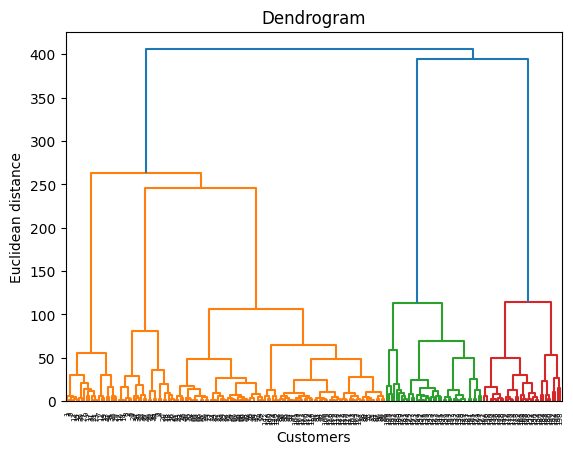

In [5]:
dendrogrm = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distance')
plt.show()

As we have already discussed to choose the number of clusters we draw a horizontal line to the longest line that traverses maximum distance up and down without intersecting the merging points. So we draw a horizontal line and the number of verticle lines it intersects is the optimal number of clusters.

In this case, it's 5. So let's fit our Agglomerative model with 5 clusters.

In [6]:
# importing AgglomerativeClustering algorithm from sklearn
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, metric = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X)

#### Visualizing the results.

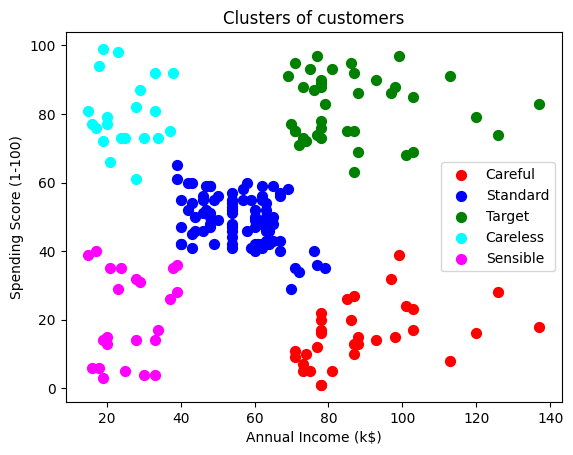

In [7]:
# Visualising the clusters
plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 50, c = 'red', label = 'Careful')
plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 50, c = 'blue', label = 'Standard')
plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 50, c = 'green', label = 'Target')
plt.scatter(X[y_hc == 3, 0], X[y_hc == 3, 1], s = 50, c = 'cyan', label = 'Careless')
plt.scatter(X[y_hc == 4, 0], X[y_hc == 4, 1], s = 50, c = 'magenta', label = 'Sensible')
plt.title('Clusters of customers')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.legend()
plt.show()

### Solving the Wholesale Customer Segmentation problem using Hierarchical Clustering

We will be working on a wholesale customer segmentation problem. The aim of this problem is to segment the clients of a wholesale distributor based on their annual spending on diverse product categories, like milk, grocery, region, etc.

In [8]:
# import neccessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
data = pd.read_csv('./Wholesale customers data.csv')
data.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [10]:
from sklearn.preprocessing import normalize
data_scaled = normalize(data)
data_scaled = pd.DataFrame(data_scaled, columns=data.columns)
data_scaled.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.000112,0.000168,0.708333,0.539874,0.422741,0.011965,0.149505,0.074809
1,0.000125,0.000188,0.442198,0.614704,0.599540,0.110409,0.206342,0.111286
2,0.000125,0.000187,0.396552,0.549792,0.479632,0.150119,0.219467,0.489619
3,0.000065,0.000194,0.856837,0.077254,0.272650,0.413659,0.032749,0.115494
4,0.000079,0.000119,0.895416,0.214203,0.284997,0.155010,0.070358,0.205294


Different types of linkages -

1. 'ward’ minimizes the variance of the clusters being merged.

2. ‘average’ uses the average of the distances of each observation of the two sets.

3. ‘complete’ or ‘maximum’ linkage uses the maximum distances between all observations of the two sets.

4. ‘single’ uses the minimum of the distances between all observations of the two sets.

Let us visualize the different types of linkages.



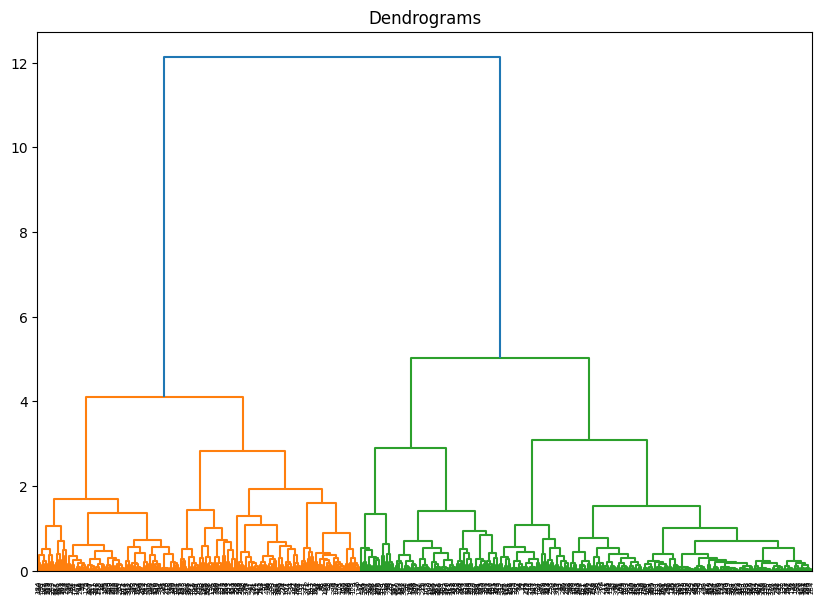

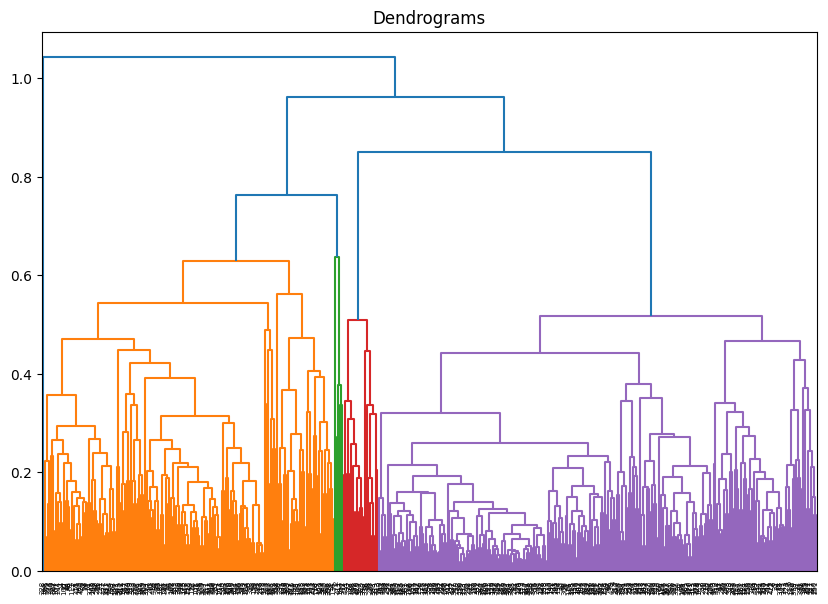

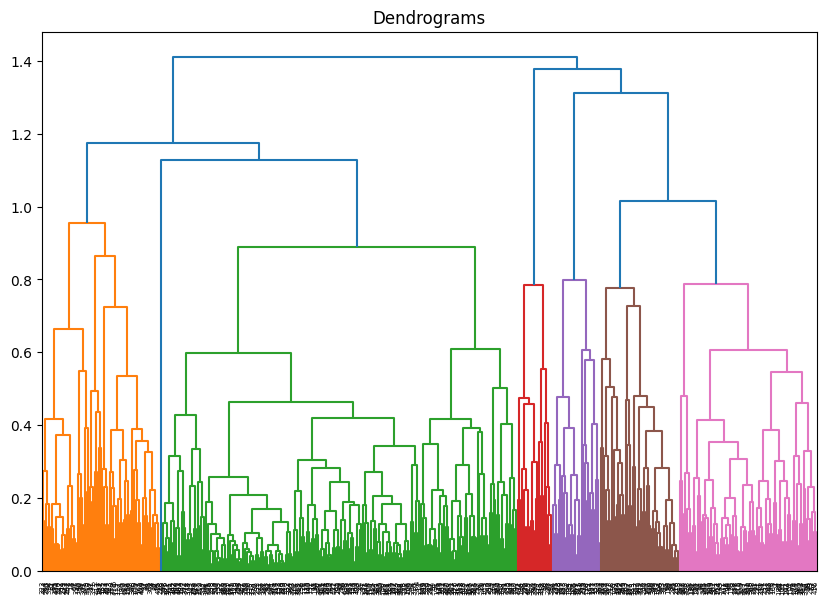

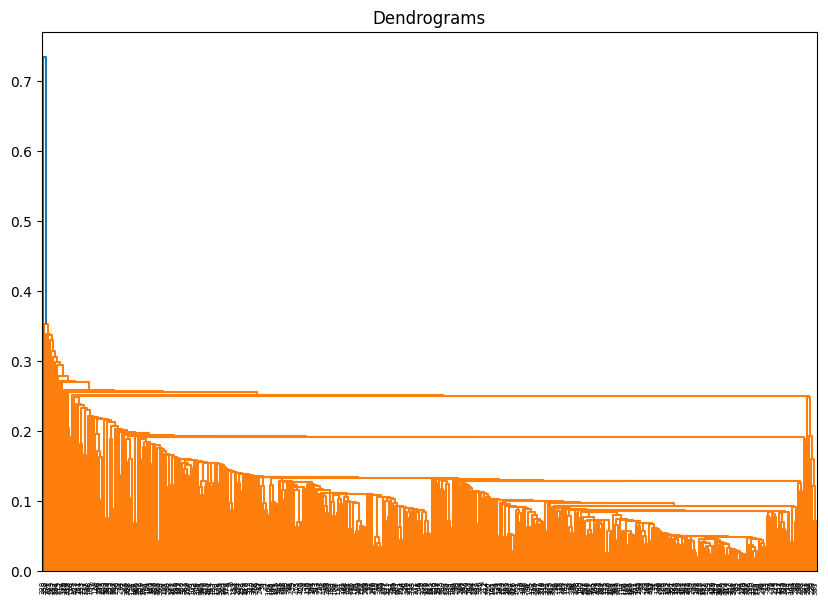

In [11]:
import scipy.cluster.hierarchy as shc
linkages = ['ward', 'average','complete','single']
for linkage in linkages:
  plt.figure(figsize=(10, 7))
  plt.title("Dendrograms")
  dend = shc.dendrogram(shc.linkage(data_scaled, method=linkage))

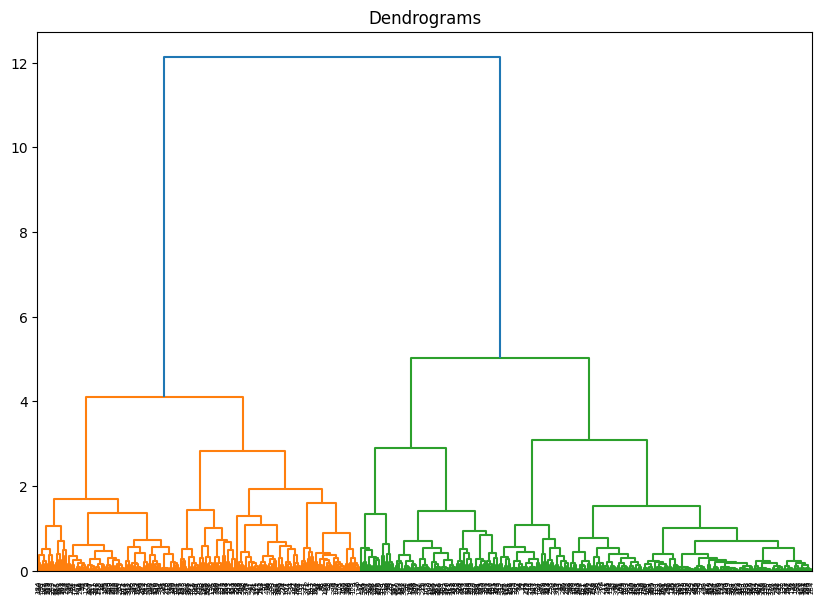

In [13]:
threshold = 20 #@param {type:"slider", min:0, max:100, step:1}

plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(data_scaled, method='ward'))
plt.axhline(y=threshold, color='r', linestyle='--')

In [14]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
cluster.fit_predict(data_scaled)

array([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0,

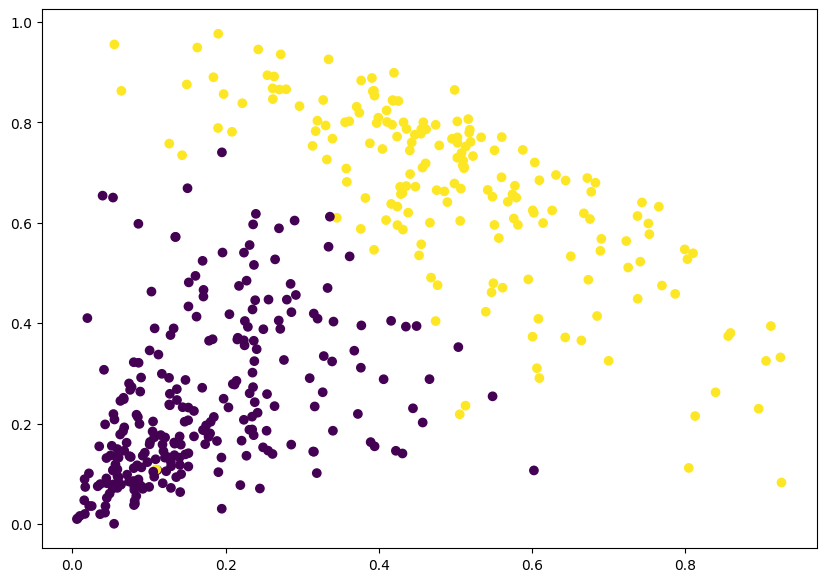

In [15]:
plt.figure(figsize=(10, 7))
plt.scatter(data_scaled['Milk'], data_scaled['Grocery'], c=cluster.labels_)

## Divisive Hierarchical Clustering

In Divisive or DIANA(DIvisive ANAlysis Clustering) is a top-down clustering method where we assign all of the observations to a single cluster and then partition the cluster to two least similar clusters. Finally, we proceed recursively on each cluster until there is one cluster for each observation. So this clustering approach is exactly opposite to Agglomerative clustering.

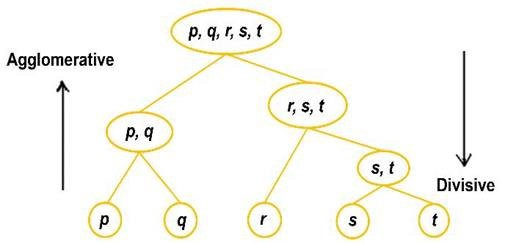

There is evidence that divisive algorithms produce more accurate hierarchies than agglomerative algorithms in some circumstances but is conceptually more complex.

In both agglomerative and divisive hierarchical clustering, users need to specify the desired number of clusters as a termination condition(when to stop merging).

Divisive clustering methods are fairly complicated to implement, so we will not do that here. You can check out open source implementations like https://github.com/div338/Divisive-Clustering-Analysis-Program-DIANA- for further details.

## Points to think about
1. What is the need for hierarchical clustering?
2. What are the key differences between KMeans Clustering and Hierarchical Clustering?
3. What is the advantages of Density Based Clustering over KMeans?

**Answers:**
1. Hierarchical clustering is needed when the number of clusters is unknown and when you want to discover the relationships between clusters. It's more flexible than K-means and can handle different cluster shapes and sizes.
2. KMeans is faster and simpler, but assumes spherical clusters of similar size and requires pre-defining the number of clusters.
    
    Hierarchical Clustering is more flexible and reveals hierarchical relationships, but can be computationally expensive and its output (dendrogram) can be complex to interpret for large datasets.
3. **Discovering clusters of arbitrary shape:** Density-based clustering can discover clusters of arbitrary shape, whereas KMeans assumes that clusters are spherical.
    
    **Handling outliers:** Density-based clustering can identify outliers as noise points, which are not assigned to any cluster. KMeans, on the other hand, forces every data point into a cluster, even if it is an outlier.
    
    **No need to specify the number of clusters:** In density-based clustering, the number of clusters is automatically determined by the algorithm, based on the density of the data points. KMeans, in contrast, requires the user to specify the number of clusters beforehand, which can be difficult to do if the data is not well understood.

## Conclusion


Hierarchical clustering is a very useful way of segmentation. The advantage of not having to pre-define the number of clusters gives it quite an edge over k-Means. However, it doesn't work well when we have huge amount of data.

## Resources and References

1. https://en.wikipedia.org/wiki/Hierarchical_clustering
2. https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/
3. https://towardsdatascience.com/understanding-the-concept-of-hierarchical-clustering-technique-c6e8243758ec
4. https://www.kdnuggets.com/2019/09/hierarchical-clustering.html

### Exercises

* Play around with different linkages and thresholds for Mall data, then use the same code base for IRIS and DIGITS dataset, to see if the optimal clusters is reasonable or not (iris should be three, digits should be 10)

* Compare the results of the that with Kmeans on the same datasets, this would require using Kmeans on Mall dataset and Wholesale customer dataset.

In [28]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris, load_digits
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

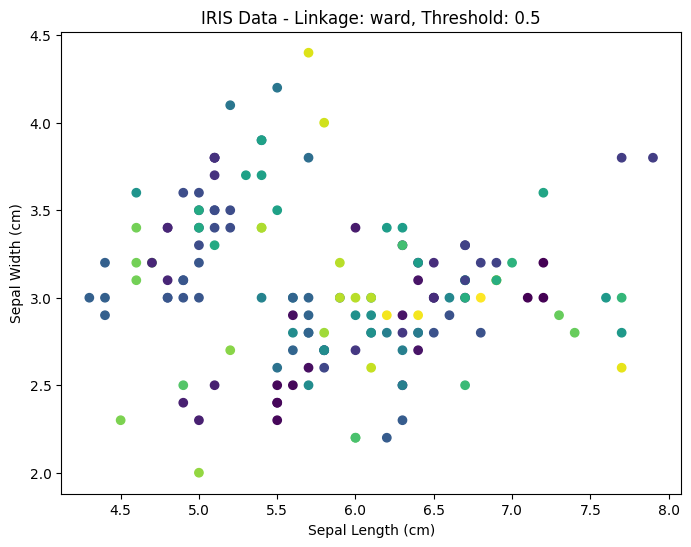

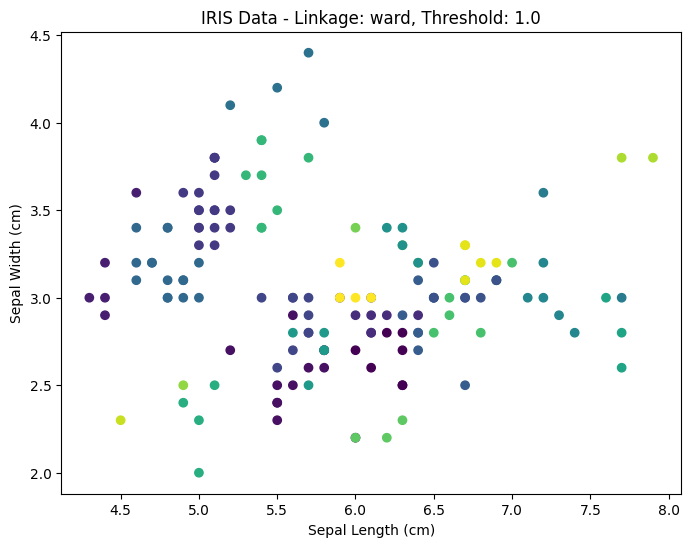

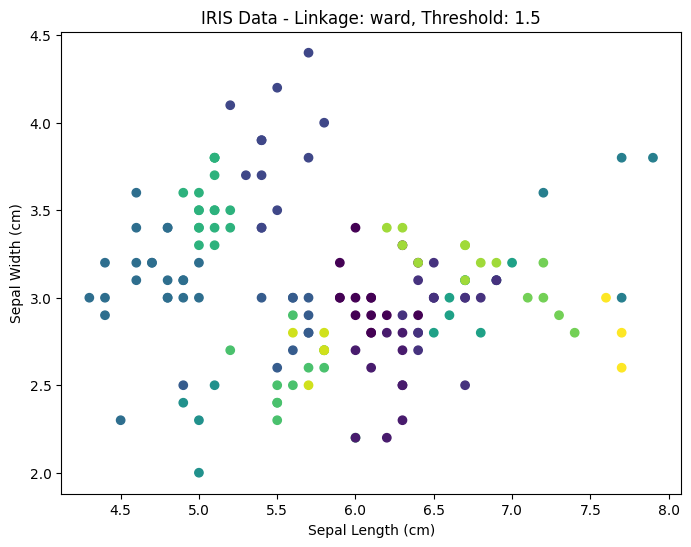

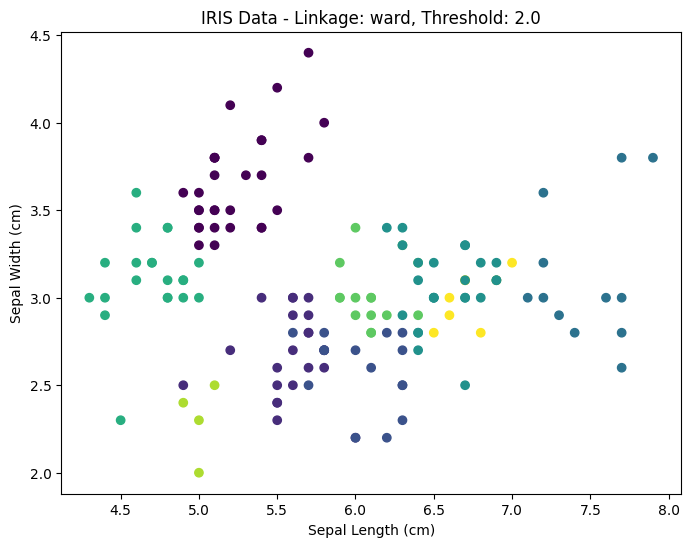

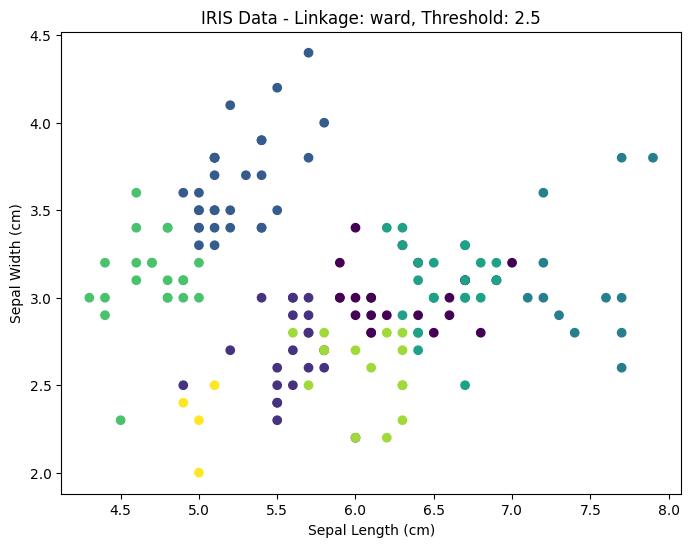

...

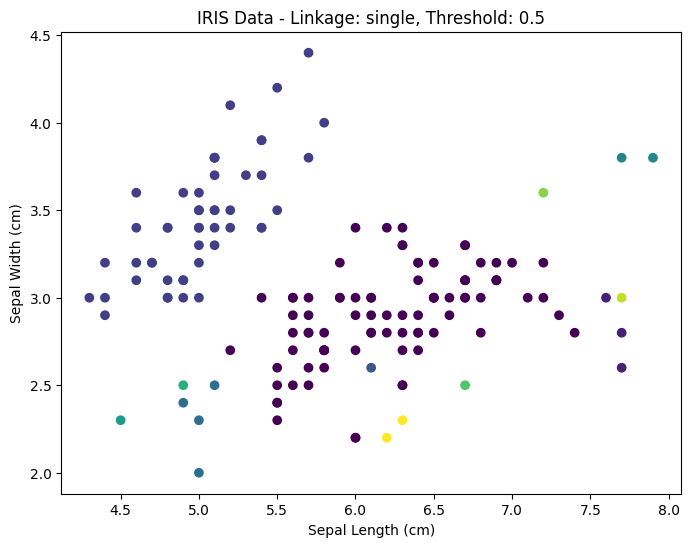

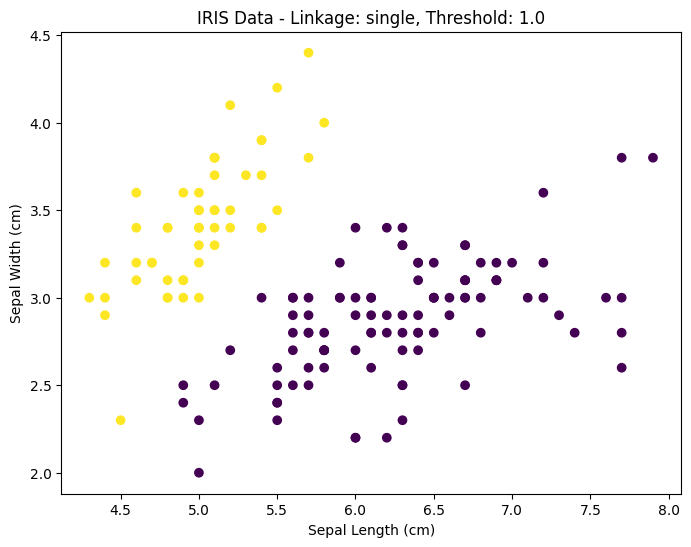

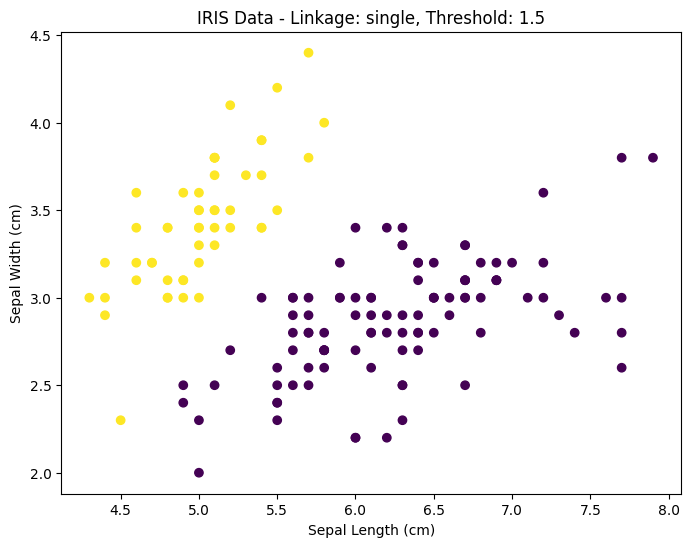

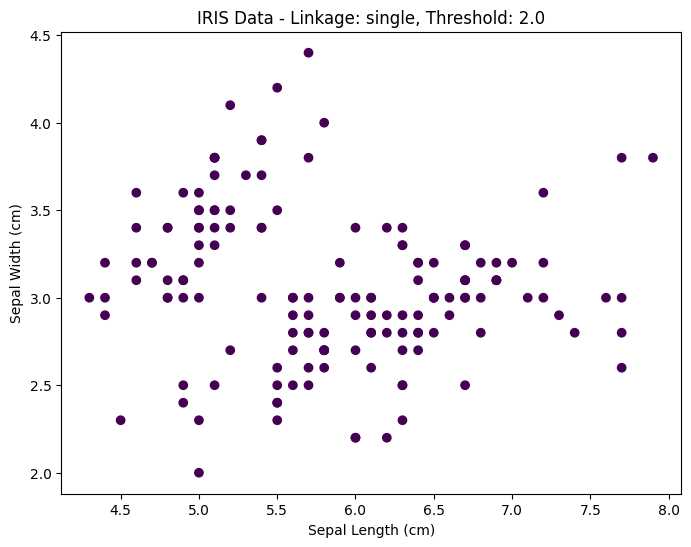

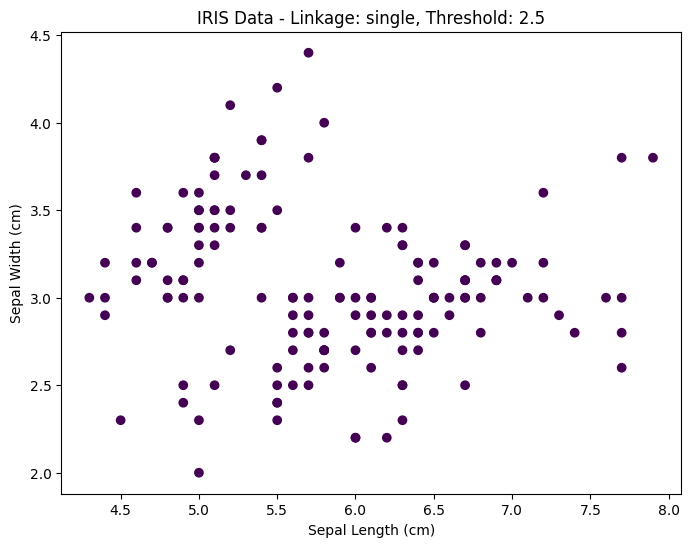

In [24]:
# IRIS Data
iris = load_iris()
X_iris = iris.data

linkages = ['ward', 'complete', 'average', 'single']
thresholds_iris = np.arange(0.5, 3.0, 0.5)

for linkage in linkages:
    for threshold in thresholds_iris:
        clustering = AgglomerativeClustering(n_clusters=None, linkage=linkage, distance_threshold=threshold)
        clustering.fit(X_iris)

        plt.figure(figsize=(8, 6))
        plt.scatter(X_iris[:, 0], X_iris[:, 1], c=clustering.labels_, cmap='viridis')
        plt.title(f'IRIS Data - Linkage: {linkage}, Threshold: {threshold}')
        plt.xlabel('Sepal Length (cm)')
        plt.ylabel('Sepal Width (cm)')


Linkage: ward, Threshold: 5, Number of clusters: 1797
Linkage: ward, Threshold: 7, Number of clusters: 1796
Linkage: ward, Threshold: 9, Number of clusters: 1791
Linkage: ward, Threshold: 11, Number of clusters: 1756
Linkage: ward, Threshold: 13, Number of clusters: 1655
Linkage: ward, Threshold: 15, Number of clusters: 1499
Linkage: ward, Threshold: 17, Number of clusters: 1298
Linkage: ward, Threshold: 19, Number of clusters: 1095
Linkage: complete, Threshold: 5, Number of clusters: 1797
Linkage: complete, Threshold: 7, Number of clusters: 1796
Linkage: complete, Threshold: 9, Number of clusters: 1791
Linkage: complete, Threshold: 11, Number of clusters: 1755
Linkage: complete, Threshold: 13, Number of clusters: 1656
Linkage: complete, Threshold: 15, Number of clusters: 1493
Linkage: complete, Threshold: 17, Number of clusters: 1287
Linkage: complete, Threshold: 19, Number of clusters: 1081
Linkage: average, Threshold: 5, Number of clusters: 1797
Linkage: average, Threshold: 7, Numbe

<ipython-input-30-d80879acb1be>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


Linkage: average, Threshold: 13, Number of clusters: 1646
Linkage: average, Threshold: 15, Number of clusters: 1465
Linkage: average, Threshold: 17, Number of clusters: 1226
Linkage: average, Threshold: 19, Number of clusters: 972
Linkage: single, Threshold: 5, Number of clusters: 1797
Linkage: single, Threshold: 7, Number of clusters: 1796
Linkage: single, Threshold: 9, Number of clusters: 1790
Linkage: single, Threshold: 11, Number of clusters: 1741
Linkage: single, Threshold: 13, Number of clusters: 1597
Linkage: single, Threshold: 15, Number of clusters: 1280
Linkage: single, Threshold: 17, Number of clusters: 872
Linkage: single, Threshold: 19, Number of clusters: 482


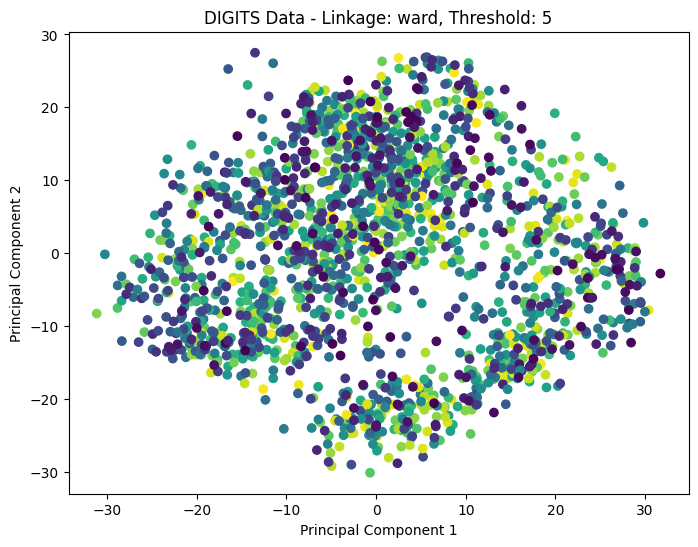

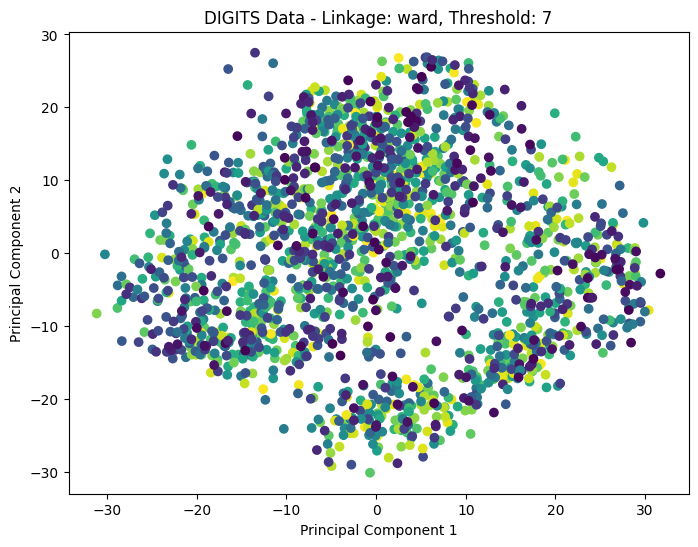

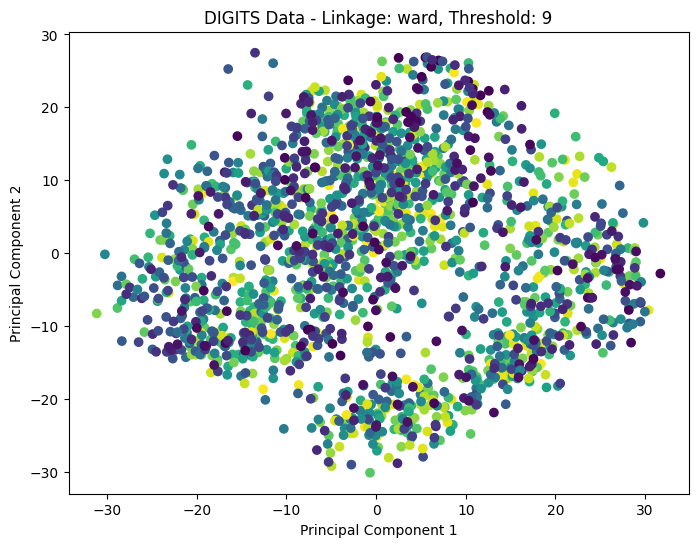

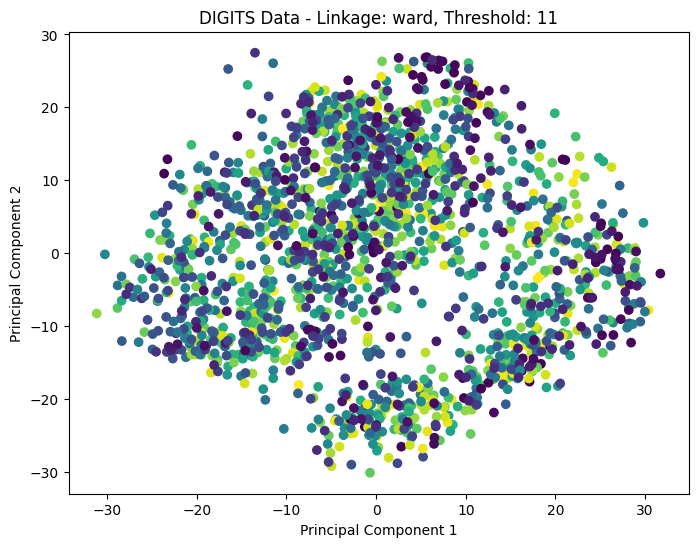

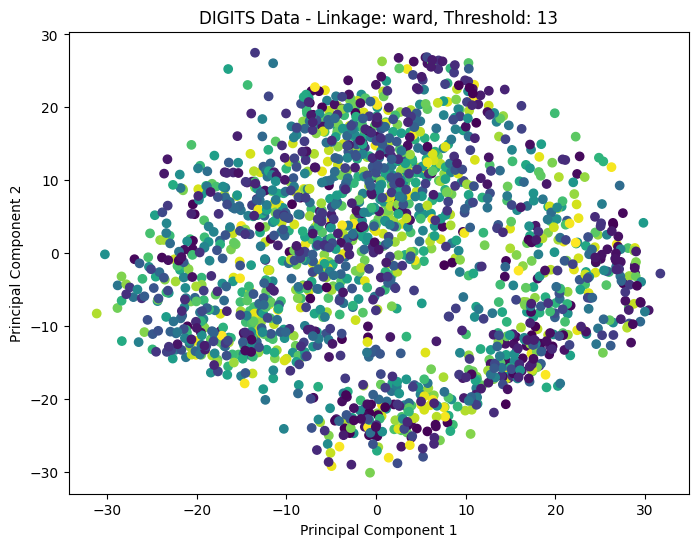

...

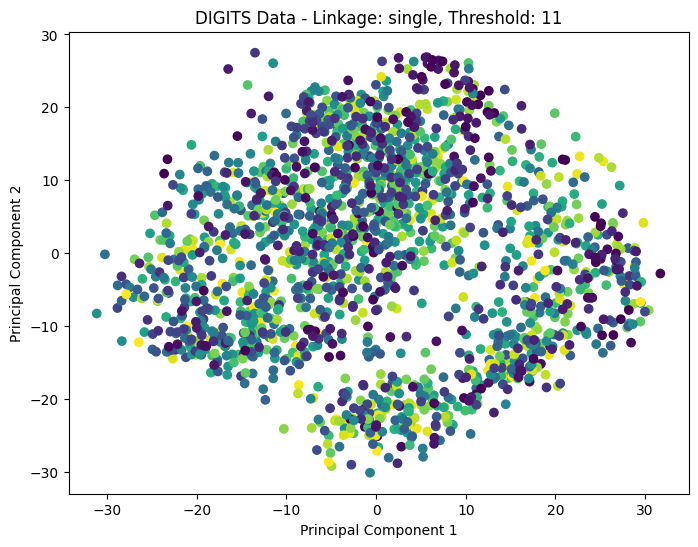

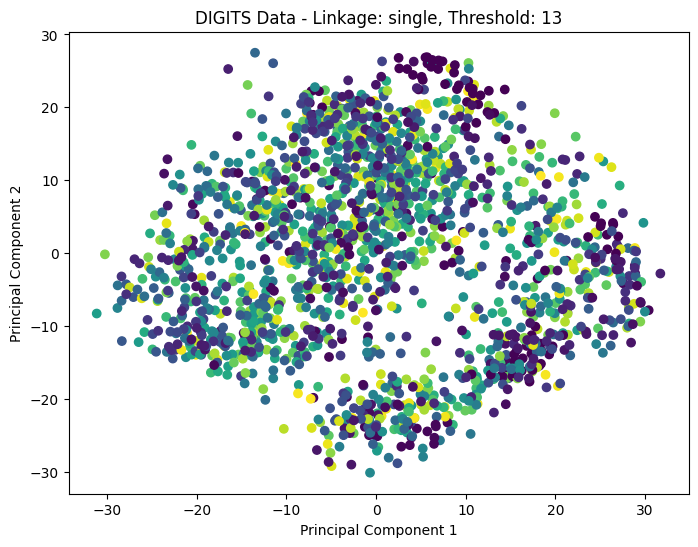

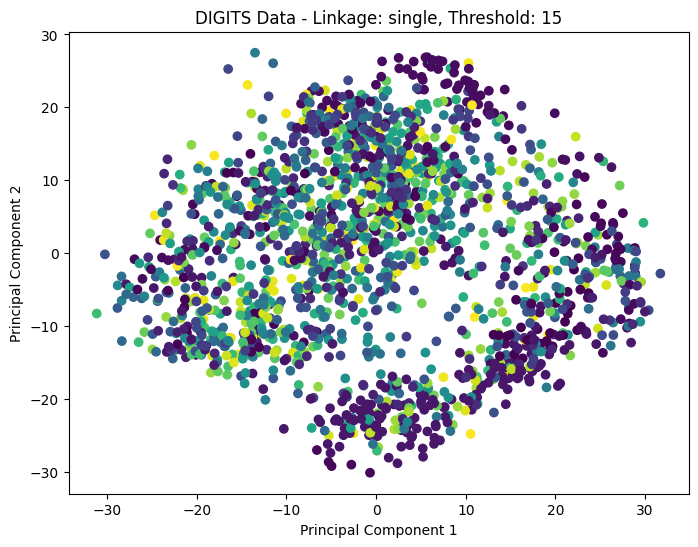

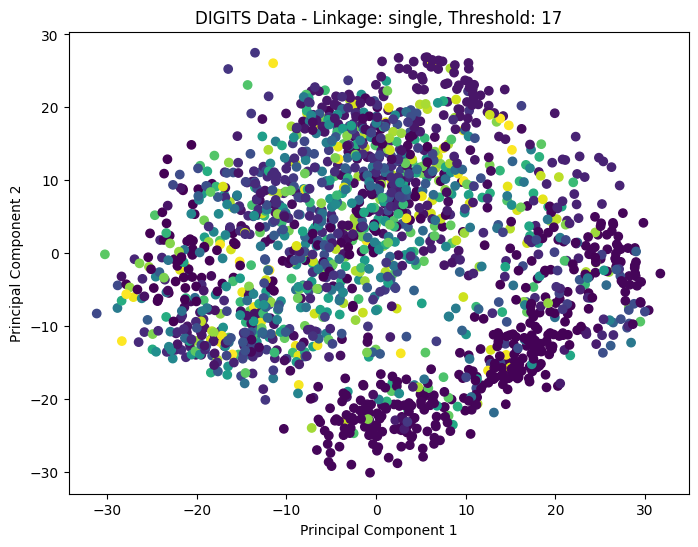

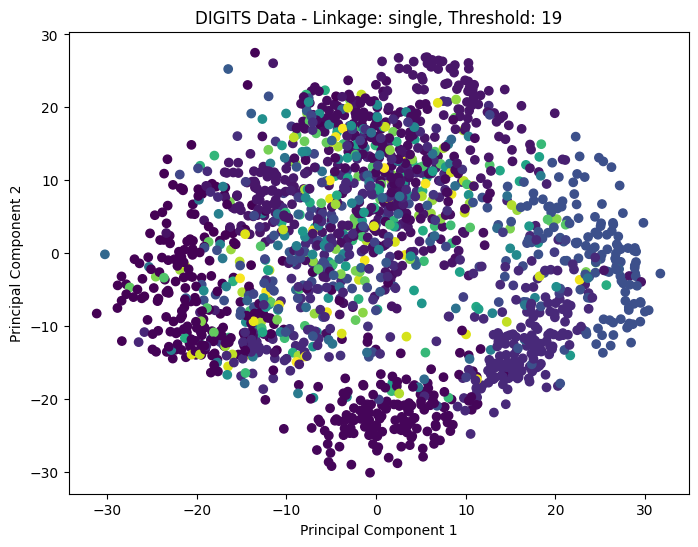

In [30]:
# DIGITS Data
digits = load_digits()
X_digits = digits.data

thresholds_digits = np.arange(5, 20, 2)

for linkage in linkages:
    for threshold in thresholds_digits:
        clustering = AgglomerativeClustering(n_clusters=None, linkage=linkage, distance_threshold=threshold)
        clustering.fit(X_digits)

        pca = PCA(n_components=2)
        X_digits_pca = pca.fit_transform(X_digits)

        plt.figure(figsize=(8, 6))
        plt.scatter(X_digits_pca[:, 0], X_digits_pca[:, 1], c=clustering.labels_, cmap='viridis')
        plt.title(f'DIGITS Data - Linkage: {linkage}, Threshold: {threshold}')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')

        # Basic evaluation (compare number of clusters with expected value of 10)
        n_clusters = len(np.unique(clustering.labels_))
        print(f'Linkage: {linkage}, Threshold: {threshold}, Number of clusters: {n_clusters}')

**KMeans**

In [31]:
import pandas as pd
import numpy as np
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.datasets import load_iris, load_digits
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

Text(0, 0.5, 'Spending Score (1-100)')

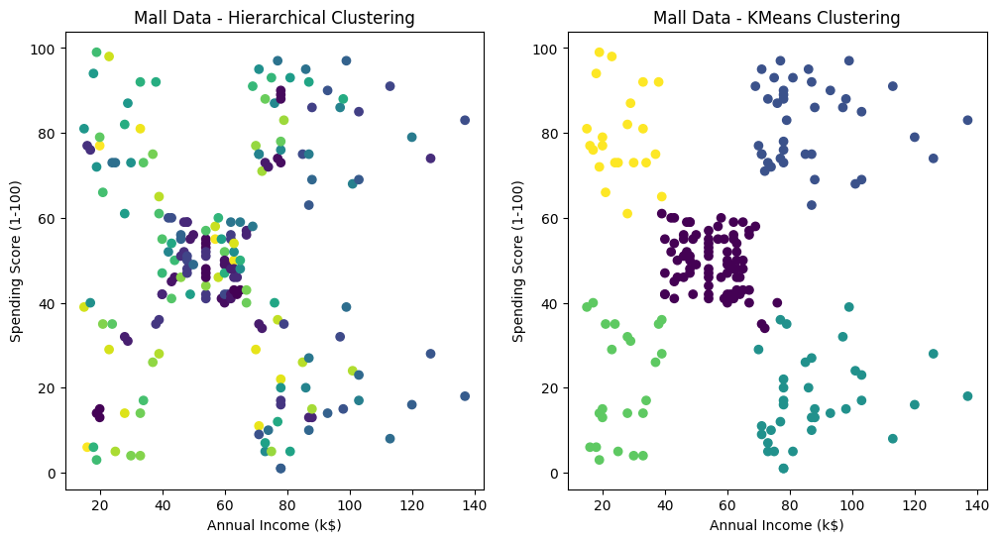

In [34]:
# Mall Data
mall_data = pd.read_csv('Mall_Customers.csv')
X_mall = mall_data[['Annual Income (k$)', 'Spending Score (1-100)']]

linkage = 'ward'
threshold = 2.0
clustering_mall_hierarchical = AgglomerativeClustering(n_clusters=None, linkage=linkage, distance_threshold=threshold)
clustering_mall_hierarchical.fit(X_mall)

n_clusters_mall = 5
clustering_mall_kmeans = KMeans(n_clusters=n_clusters_mall, random_state=0)
clustering_mall_kmeans.fit(X_mall)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X_mall['Annual Income (k$)'], X_mall['Spending Score (1-100)'], c=clustering_mall_hierarchical.labels_, cmap='viridis')
plt.title('Mall Data - Hierarchical Clustering')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')

plt.subplot(1, 2, 2)
plt.scatter(X_mall['Annual Income (k$)'], X_mall['Spending Score (1-100)'], c=clustering_mall_kmeans.labels_, cmap='viridis')
plt.title('Mall Data - KMeans Clustering')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')